In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
import matplotlib.pyplot as plt
import pandas as pd
import librosa
import tqdm
import sys
import sklearn.decomposition, sklearn.compose
import seaborn as sns
sys.path.append('../src')
from features import *

In [2]:
config = {
    'sr': 10000,
    'frame_size': 1024*2,
    'hop_size': 1024*2,
    'n_coeff': 50,
    'size': 10
}

In [3]:
df = pd.read_pickle('../recordings.pkl')
df = df[df['violin'].isin([1,2,3,4,5,6])]
df = df[df['type'] == 'scale']

In [4]:
# Features
data = []
for index, row in tqdm.tqdm(df.iterrows(), total=df.shape[0]):
    y, _    = librosa.load(str(row['file']), sr=config['sr'])
    
    for audio in np.split(y, np.arange(config['sr']*config['size'], len(y), config['sr']*config['size'])):

        features = y
        for step in pipes['MFCC_librosa']:
            features = step(features, **config)
        features_dic = {f'feature_{i}': coeff for i, coeff in enumerate(features)}

        dic = row.to_dict()
        dic['audio'] = audio
        dic.update(features_dic)

        data.append(dic)

features_df = pd.DataFrame(data)
X = features_df.iloc[:, -config['n_coeff']:]

100%|██████████| 136/136 [00:10<00:00, 12.52it/s]


In [5]:
features_df.describe()

,player,violin,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,...,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49
count,478.000000,478.000000,478.000000,478.000000,478.000000,478.000000,478.000000,478.000000,478.000000,478.000000,...,478.000000,478.000000,478.000000,478.000000,478.000000,478.000000,478.000000,478.000000,478.000000,478.000000
mean,13.288703,3.502092,-306.134247,-17.745367,5.461528,10.441574,-14.555364,4.201374,-14.690742,-2.270473,...,-1.898204,3.568140,-2.827342,-0.324909,-2.529280,0.811563,0.397420,1.197578,-2.502089,1.437698
std,7.203272,1.706749,31.575829,8.080656,7.880271,6.189213,6.056967,5.929263,5.781221,4.470039,...,2.593727,2.935440,2.235344,2.433664,2.292112,2.148636,2.238120,2.424865,2.668166,2.487742
min,1.000000,1.000000,-388.547150,-38.361774,-14.052435,-5.591662,-33.290970,-11.286232,-32.057255,-18.371777,...,-8.683221,-3.625586,-9.471989,-8.121306,-7.509293,-6.611649,-5.884727,-5.788687,-9.038905,-5.236911
25%,7.000000,2.000000,-327.544220,-22.549253,-0.036883,5.959568,-17.402534,1.372496,-18.303345,-5.342030,...,-3.505311,1.525476,-4.209918,-2.304236,-4.410173,-0.802503,-0.724799,-0.683262,-3.892998,-0.173253
50%,13.000000,3.000000,-304.839722,-18.567736,5.764232,10.573559,-13.561160,5.562426,-14.056668,-2.199571,...,-1.951156,3.619886,-2.875634,-0.227985,-2.795234,0.846775,0.316407,1.396803,-2.491438,1.546585
75%,19.000000,5.000000,-289.845032,-13.043466,11.531151,15.277040,-10.468029,8.364105,-10.651447,1.051251,...,-0.176485,5.257257,-1.711579,1.349148,-1.042034,2.443012,1.786583,3.049303,-0.583650,3.352849
max,26.000000,6.000000,-208.222794,7.798062,23.367590,26.185347,-3.089537,19.402330,-1.651436,9.737891,...,5.996386,11.921713,4.991123,5.337310,2.929418,6.727682,5.566856,7.356236,8.557915,7.081668


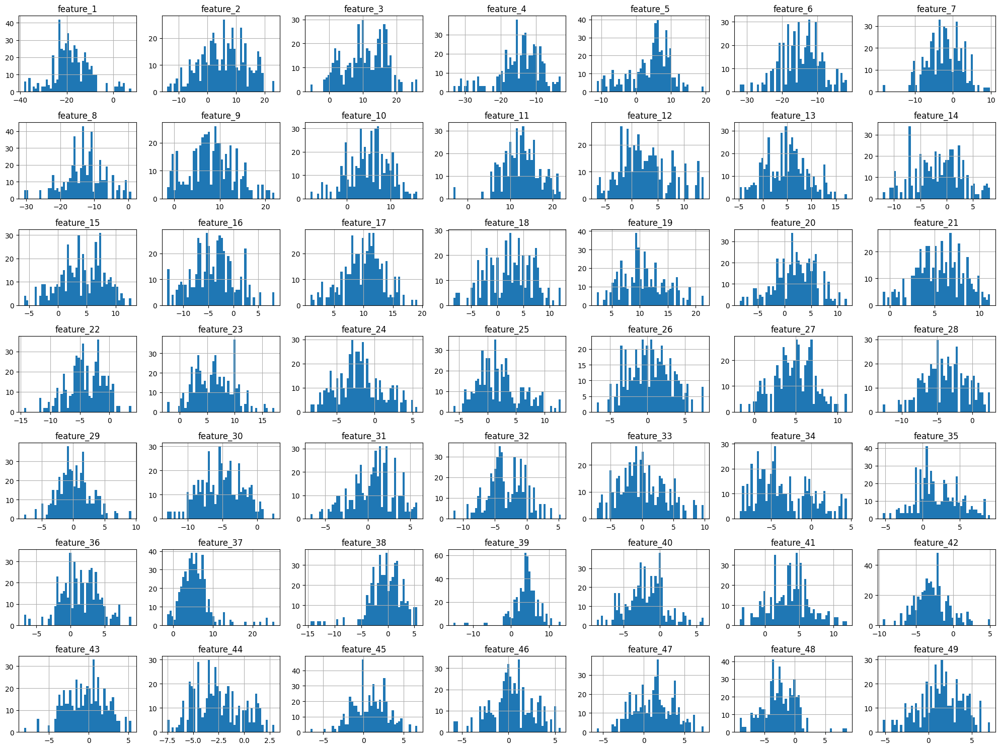

In [6]:
%matplotlib inline
features_df.iloc[:, -config['n_coeff']+1:].hist(bins=50, figsize=(20,15))
plt.tight_layout()
plt.show()

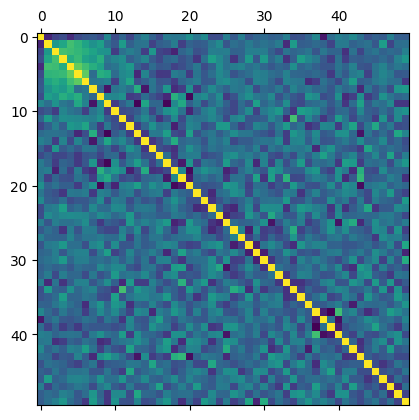

In [7]:
corr_matrix = features_df.iloc[:, -config['n_coeff']:].corr()
plt.matshow(corr_matrix)
plt.show()

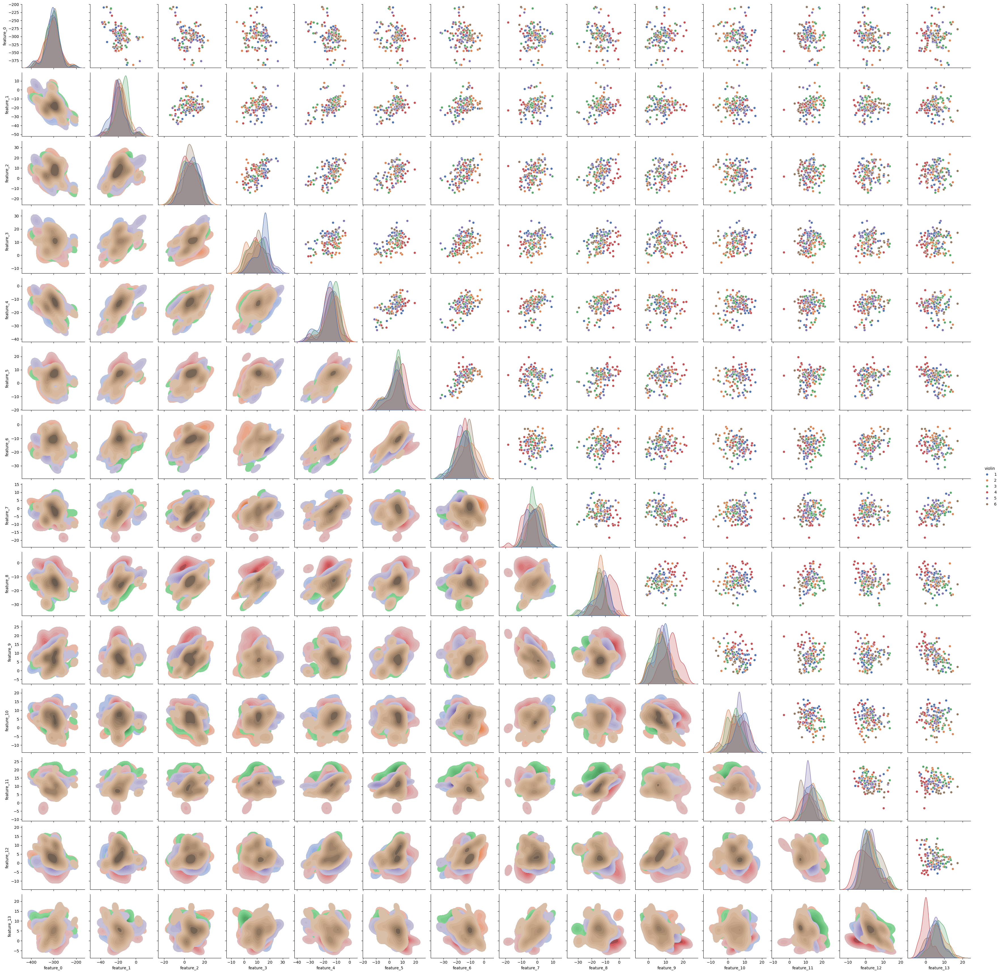

In [8]:
# colors = 
# pd.plotting.scatter_matrix(features_df.iloc[:, -config['n_coeff']:-config['n_coeff']+10], figsize=(20,15))
g = sns.pairplot(features_df.drop(['file', 'player', 'audio', 'type'], axis=1).iloc[:,:15], hue='violin', palette='deep')
g.map_lower(sns.kdeplot, fill=True)

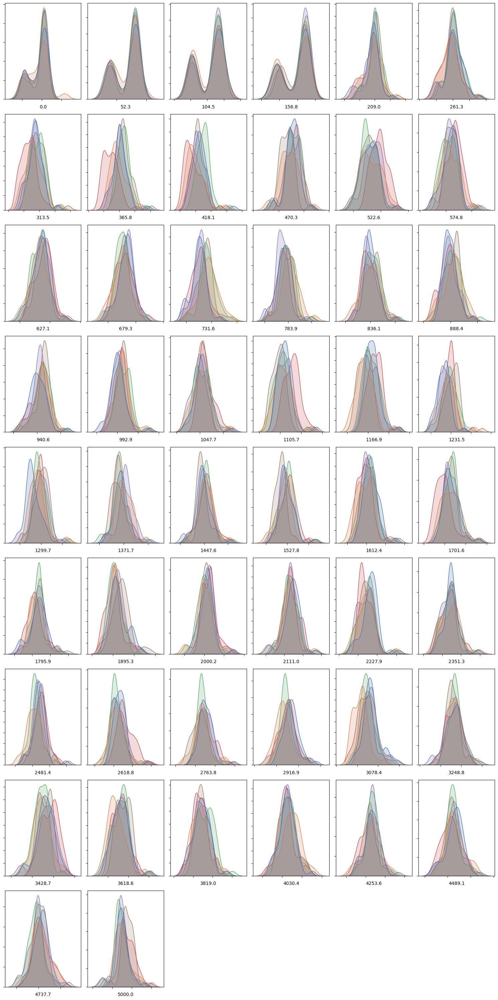

In [10]:
n_cols = 6
n_rows = config['n_coeff'] // n_cols + 1
# n = np.ceil(np.sqrt(config['n_coeff'])).astype(int)
plt.figure(figsize=(15,30))
freqs = np.round(librosa.mel_frequencies(n_mels=config['n_coeff'], fmax=config['sr']//2), 1)

for i, column in enumerate(features_df.iloc[:, -config['n_coeff']:].columns):
    plt.subplot(n_rows,n_cols,i+1)
    g = sns.kdeplot(features_df, x=column, hue='violin', palette='deep', legend=False, fill=True, alpha=.2)
    g.set(xlabel=freqs[i])
    g.set(xticklabels=[])
    g.set(ylabel=None)
    g.set(yticklabels=[])

plt.tight_layout()

<Figure size 640x480 with 0 Axes>

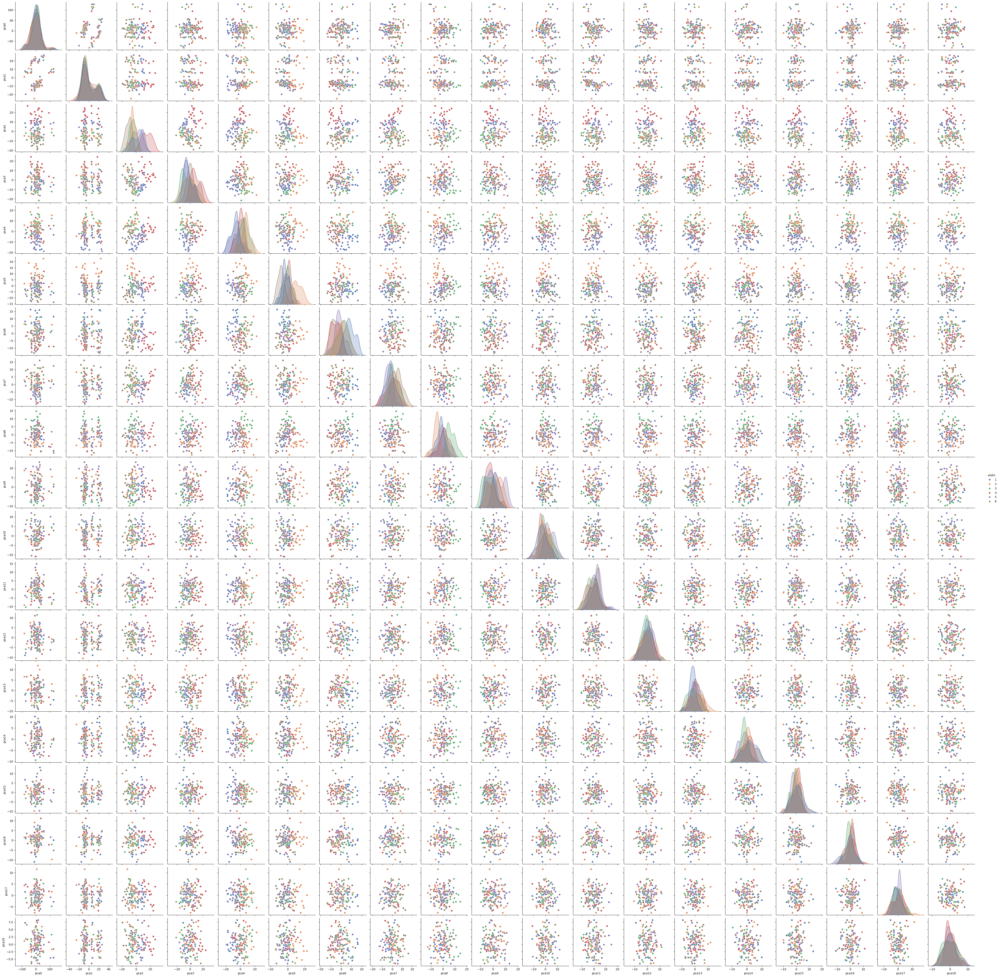

In [10]:
X = features_df.drop(['file', 'player', 'audio', 'type', 'violin'], axis=1)
pca = sklearn.decomposition.PCA()
# pca = sklearn.decomposition.KernelPCA(kernel="rbf", gamma=1e-3)
pca.set_output(transform='pandas')
components = pca.fit_transform(X)
components.insert(loc=0, column='violin', value=features_df['violin'])
components.tail()
# components = pd.DataFrame(components, index=X.index, columns=X.columns)

# cumsum = np.cumsum(pca.explained_variance_ratio_)
# plt.figure()
# plt.plot(cumsum)

plt.figure()
sns.pairplot(components.iloc[:,:20], hue='violin', palette='deep')

plt.show()

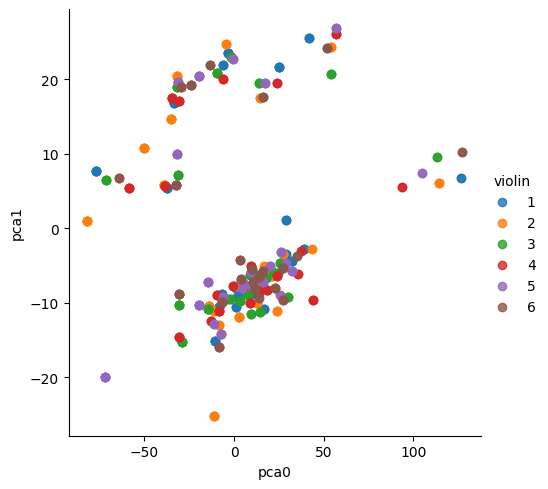

In [11]:
sns.lmplot(
    x='pca0', 
    y='pca1', 
    data=components, 
    hue='violin',
    fit_reg=False
)